In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import skimage.io, skimage.color
import time

#### Ładowanie obrazów w przestrzeni HSV

In [2]:
pliki = 'obrazy/samolot{numer:02d}.jpg'

## Kroki procesu

#### pobieranie kanału V z HSV

In [4]:
def pobierz_kanał_v(obraz):
    return obraz[:,:,2]

#### normalizacja wartości obrazu

In [5]:
def normalizacja_min_max(obraz):
    obraz -= np.min(obraz)
    obraz /= np.max(obraz)
    return obraz

#### obliczanie różnicy słabo i mocno rozmytego obrazu (pozbycie się chmur i gradientów nieba)

In [6]:
def różnica_rozmyć(obraz, wielkość_małe_rozm, wielkość_duże_rozm, wielkość_koń_rozm = 7, wyostrzenie = 0.3):
    
    #oblicznaie różnicy rozmyć gaussa o różnej wielkości
    mniejsze_rozmycie = cv2.GaussianBlur(obraz, (wielkość_małe_rozm, wielkość_małe_rozm), 10000)
    większe_rozmycie = cv2.GaussianBlur(obraz, (wielkość_duże_rozm, wielkość_duże_rozm), 10000)
    wynik = mniejsze_rozmycie - większe_rozmycie
    wynik = normalizacja_min_max(wynik)
    
    #wyostrzanie wyniku
    wynik = cv2.GaussianBlur(wynik, (wielkość_koń_rozm,wielkość_koń_rozm), 10000)
    wynik = np.clip(wynik, wyostrzenie, 1-wyostrzenie)
    wynik = normalizacja_min_max(wynik)
    
    return wynik

#### wykrywanie krawędzi - algorytm Canny'ego

In [14]:
def canny(obraz, threshold1, threshold2, dylatacja = 3):
    obraz_uint8 = (obraz*255).astype(np.uint8)
    wynik = cv2.Canny(obraz_uint8, threshold1, threshold2)
    wynik = cv2.dilate(wynik, np.ones((dylatacja, dylatacja), np.uint8))
    return wynik

#### zamienianie wykrytych krawędzi na bloby

In [8]:
def blobs(obraz, dylatacja):
    wynik = cv2.dilate(obraz, np.ones((dylatacja, dylatacja), np.uint8))
    _, wynik = cv2.threshold(wynik, 50, 50, cv2.THRESH_BINARY); # zamiana białego tła i wnętrza samolotów na szary
    cv2.floodFill(wynik, np.zeros((wynik.shape[0]+2, wynik.shape[1]+2), np.uint8), (0, 0), 255) # wypełnanie tła na biało
    _, wynik = cv2.threshold(wynik, 100, 255, cv2.THRESH_BINARY); # zamiana szarego wnętrza samolotów na czarny
    return wynik

#### wykrywanie, obliczanie środków i wielkości blobów

In [9]:
def znajdź_blobs(obraz):
    params = cv2.SimpleBlobDetector_Params()
    params.minDistBetweenBlobs = 1
    params.filterByColor = True
    params.blobColor = 0
    params.minThreshold = 1
    params.maxThreshold = 5000
    params.filterByArea = True
    params.minArea = 10
    params.maxArea = 100000
    params.filterByCircularity = False
    params.filterByConvexity = False
    params.filterByInertia = False
    detector = cv2.SimpleBlobDetector_create(params)
    wynik = detector.detect(obraz)
    return wynik

#### dodawanie wyników do orginalnego obrazu

In [10]:
def stwórz_obraz_wynikowy(orginał, blobs_obraz, blobs_paramtery, krawędzie):
    orginał_rgb = (skimage.color.hsv2rgb(orginał)*255).astype(np.uint8)
    blobs_obraz_rgb = skimage.color.gray2rgb(blobs_obraz)

    # kolorowanie każdego bloba na inny kolor
    for i, kp in enumerate(blobs_paramtery):
        krawędzie_kolor = skimage.color.hsv2rgb([i/(len(blobs_paramtery)+1), 1, 1])*255
        cv2.floodFill(blobs_obraz_rgb, np.zeros((blobs_obraz.shape[0]+2, blobs_obraz.shape[1]+2), np.uint8), (int(kp.pt[0]), int(kp.pt[1])), krawędzie_kolor)
    
    # kolorowanie krawędzi pokruwających sią z blobami
    blobs_obraz_rgb[krawędzie < 100] = [0, 0, 0]
    
    # nakładanie krawędzi na orginalny obraz
    for x in range(orginał_rgb.shape[0]):
        for y in range(orginał_rgb.shape[1]):
            if np.sum(blobs_obraz_rgb[x, y]) != 0 :
                orginał_rgb[x, y] = blobs_obraz_rgb[x, y]
                
    # dodawanie do orginału środków i okręgów na podstawie paramterów blobów
    for i, kp in enumerate(blobs_paramtery):
        blobs_paramtery_kolor = skimage.color.hsv2rgb([i/(len(blobs_paramtery)+1), 1, 0.75])*255
        cv2.rectangle(orginał_rgb, (int(kp.pt[0])-5, int(kp.pt[1])-5), (int(kp.pt[0])+5, int(kp.pt[1])+5), blobs_paramtery_kolor, 4)
        orginał_rgb = cv2.drawKeypoints(orginał_rgb, [kp], np.array([]), blobs_paramtery_kolor, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    return orginał_rgb


## Wykonywanie oznaczania samolotów

In [11]:
def oznacz_samoloty(obraz):
    kanał_v = pobierz_kanał_v(obraz)
    różnica = różnica_rozmyć(kanał_v, 7, 31)
    krawędzie = canny(różnica, 100, 200)
    blobs_obraz = blobs(krawędzie, 30)
    blobs_parametry = znajdź_blobs(blobs_obraz)
    obraz_wynikowy = stwórz_obraz_wynikowy(obraz, blobs_obraz, blobs_parametry, krawędzie)
    return obraz_wynikowy

In [12]:
def wyświetl_obraz(obraz):
    plt.figure(figsize=(12, 12))
    ax = plt.gca()
    plt.imshow(obraz, cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.show()

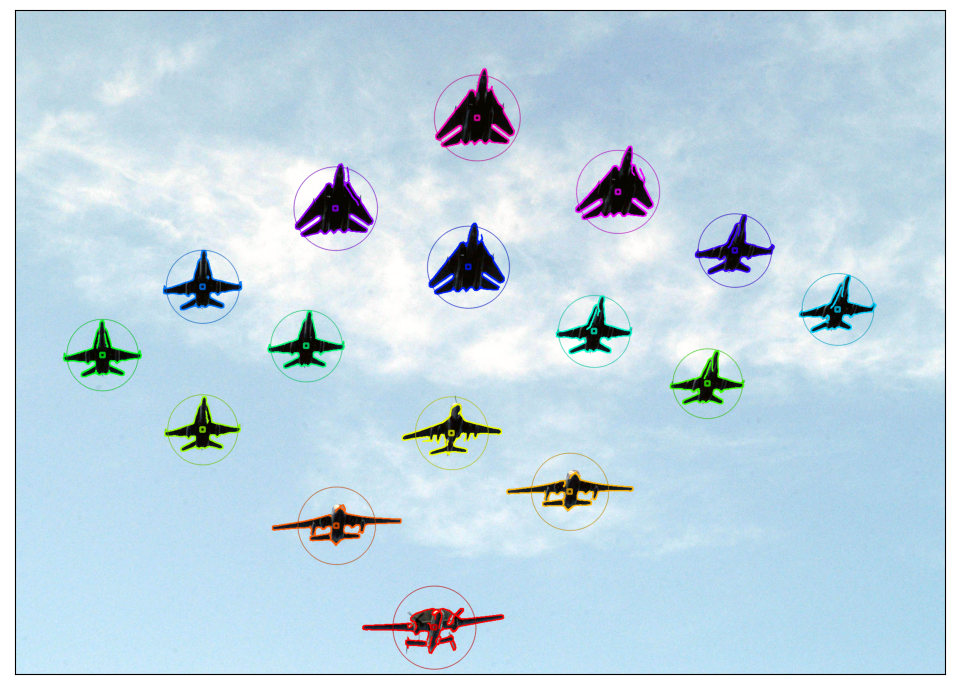

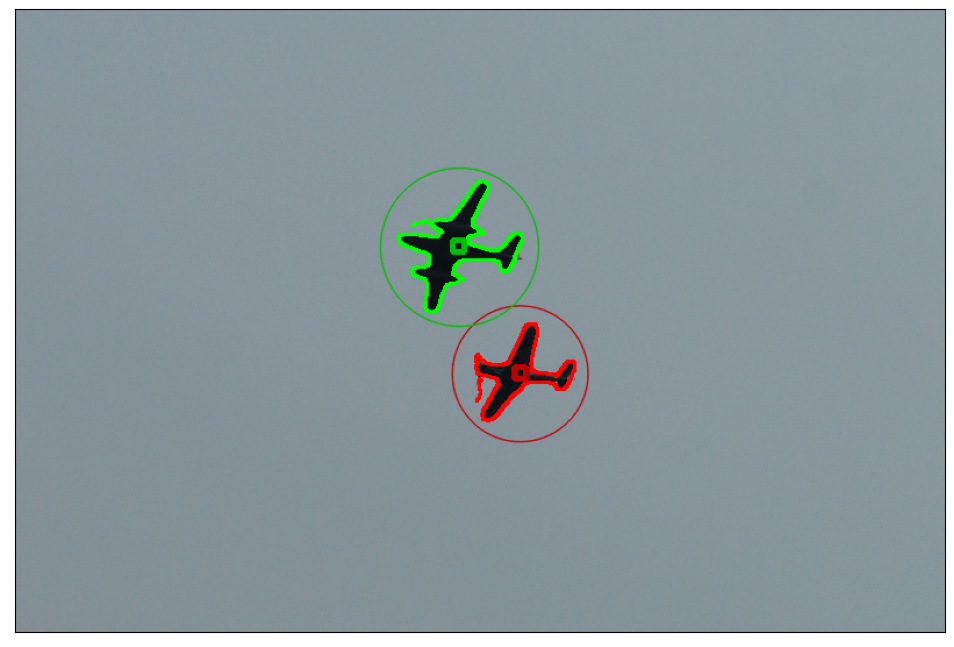

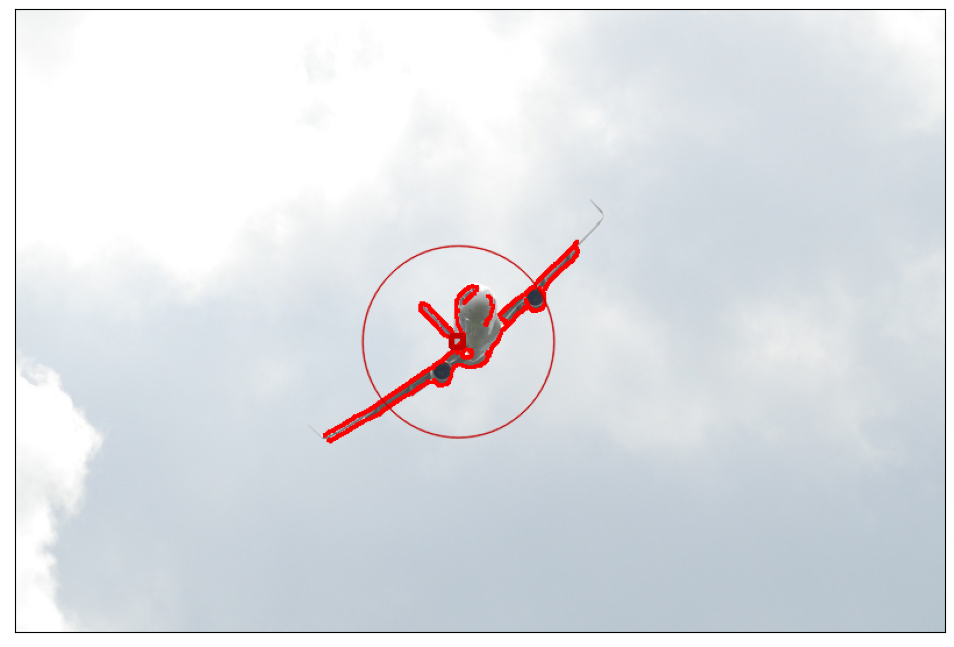

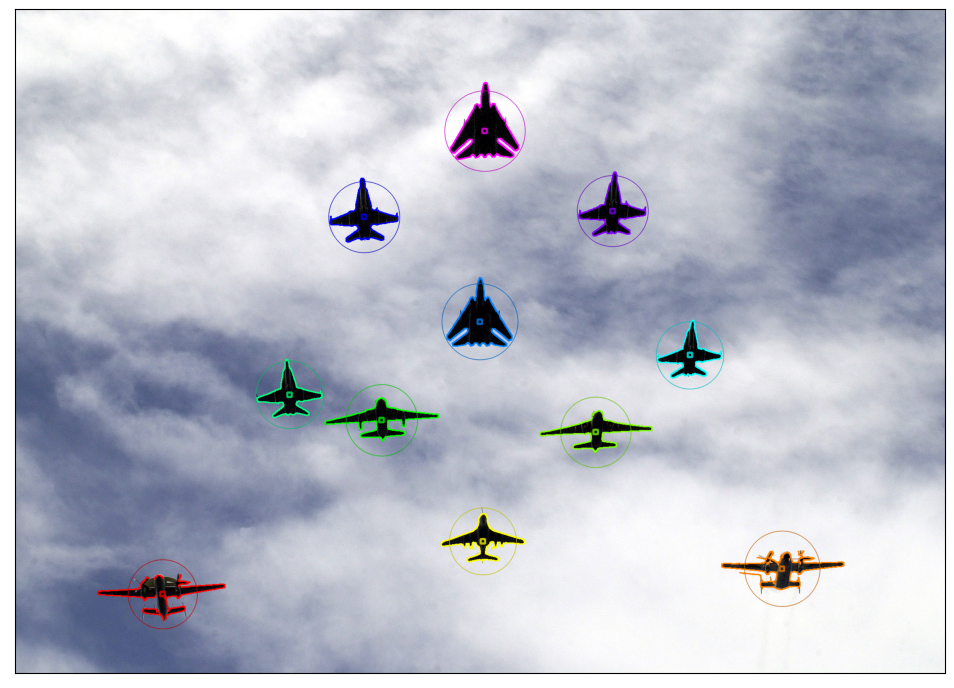

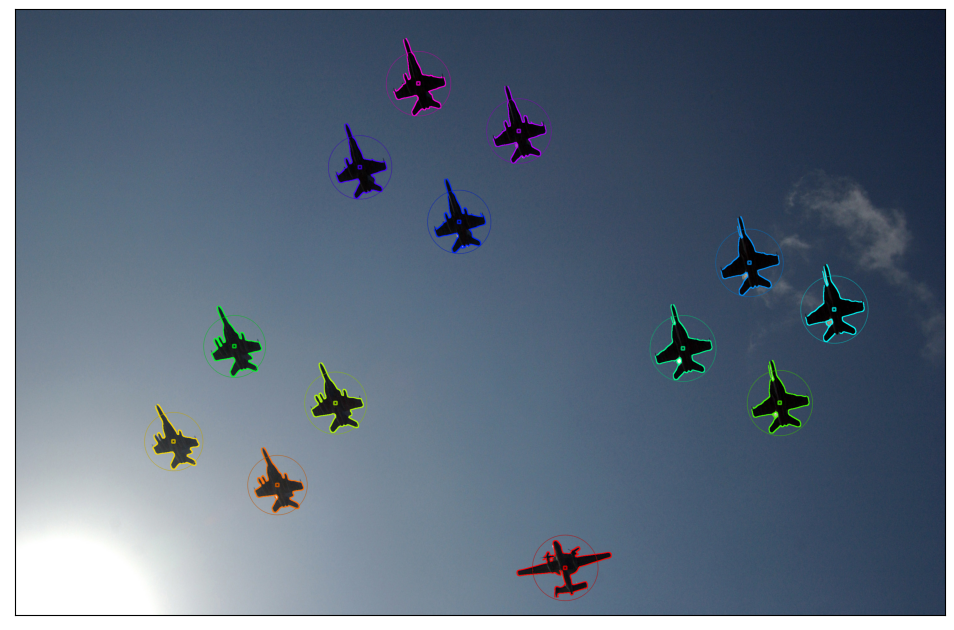

...

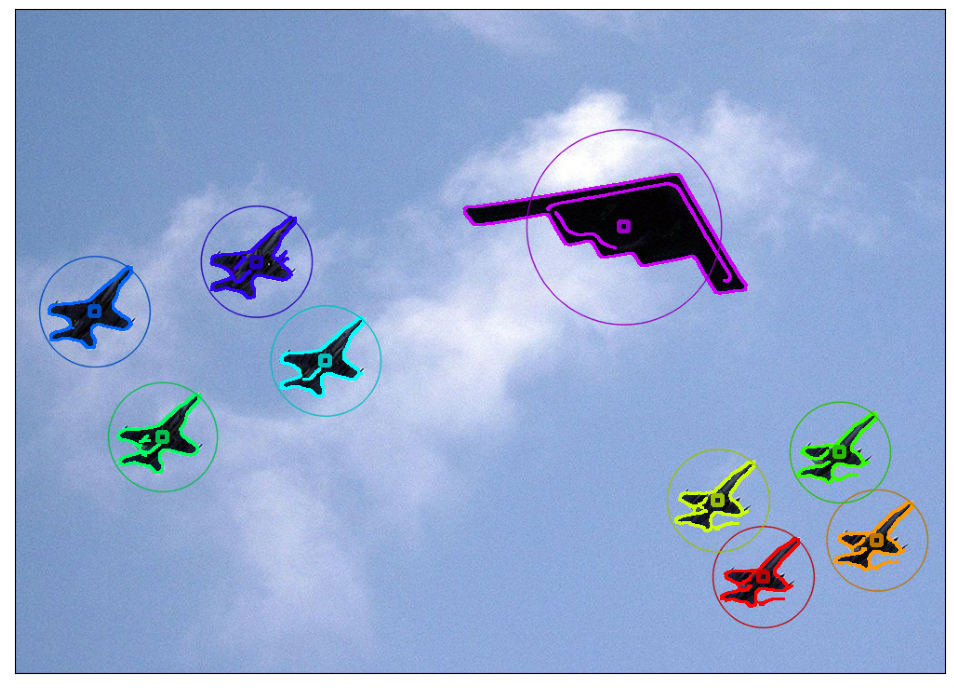

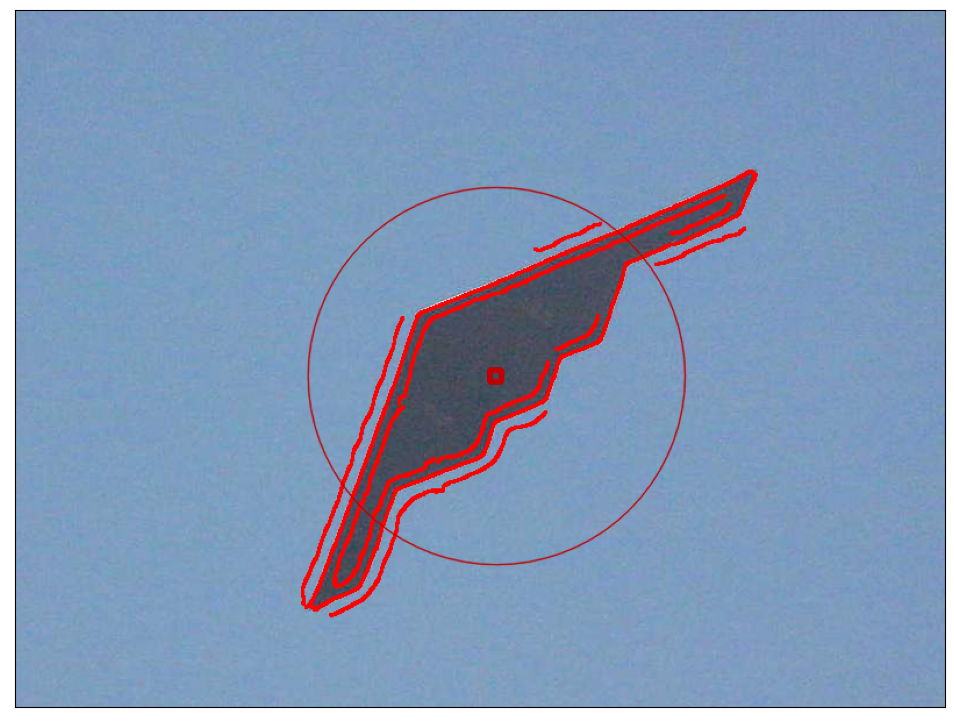

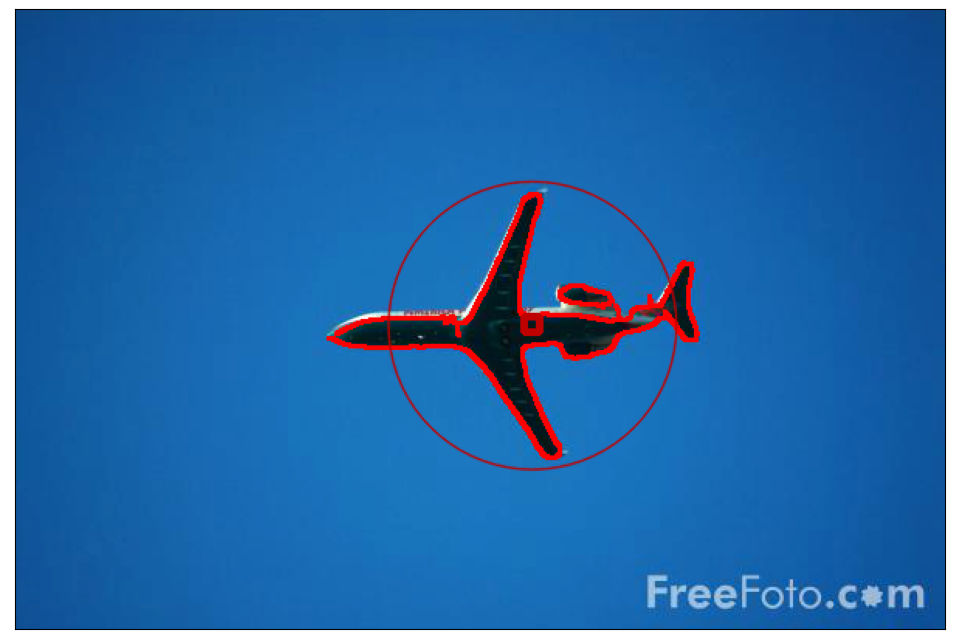

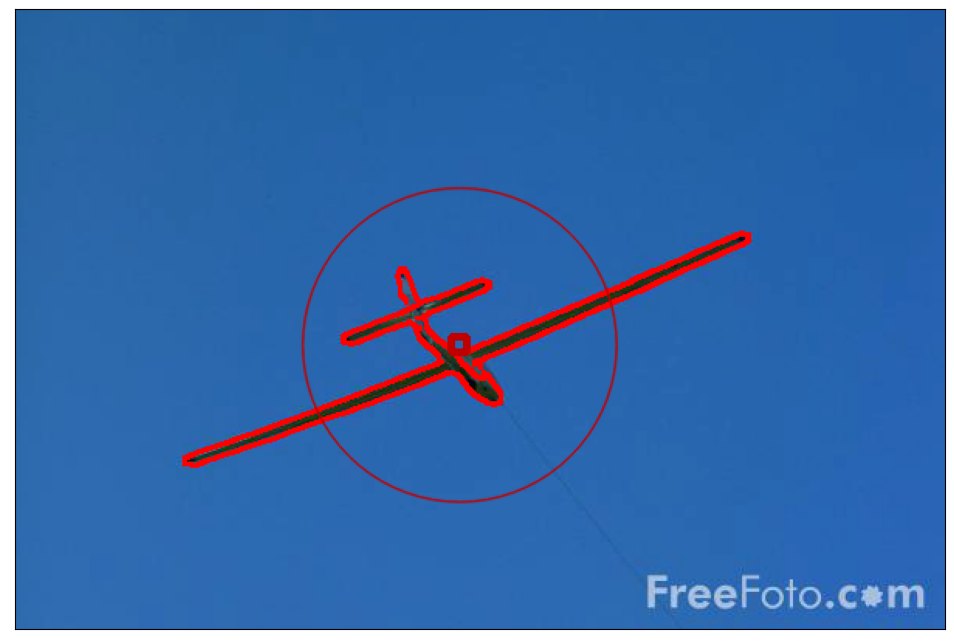

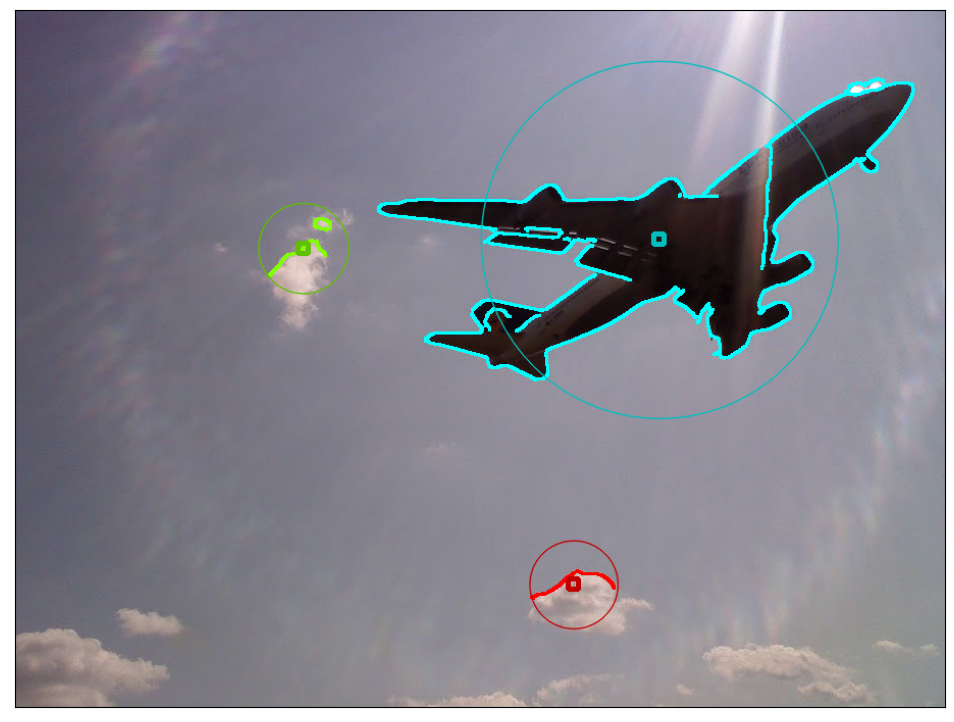

In [13]:
for obraz in obrazy:
    wynik = oznacz_samoloty(obraz)
    wyświetl_obraz(wynik)